# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [ ]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](https://github.com/amanchadha/coursera-gan-specialization/blob/main/C1%20-%20Build%20Basic%20Generative%20Adversarial%20Networks/Week%201/MnistExamples.png?raw=1)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [ ]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [ ]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [ ]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [ ]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [ ]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples,z_dim,device=device)
    #### END CODE HERE ####

In [ ]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](https://github.com/amanchadha/coursera-gan-specialization/blob/main/C1%20-%20Build%20Basic%20Generative%20Adversarial%20Networks/Week%201/relu-graph.png?raw=1)  |  ![](https://github.com/amanchadha/coursera-gan-specialization/blob/main/C1%20-%20Build%20Basic%20Generative%20Adversarial%20Networks/Week%201/lrelu-graph.png?raw=1)





In [ ]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
         nn.Linear(input_dim, output_dim), #Layer 1
         nn.LeakyReLU(0.2, inplace=True)
        #### END CODE HERE ####
    )

In [ ]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5
    
    assert str(block.__getitem__(0)).replace(' ', '') == f'Linear(in_features={in_features},out_features={out_features},bias=True)'        
    assert str(block.__getitem__(1)).replace(' ', '').replace(',inplace=True', '') == 'LeakyReLU(negative_slope=0.2)'


test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [ ]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim, 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [ ]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4
    assert type(disc.__getitem__(3)) == nn.Linear

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [ ]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [ ]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [ ]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake.detach())
    disc_fake_loss = criterion(disc_fake_pred, torch.zeros_like(disc_fake_pred))
    disc_real_pred = disc(real)
    disc_real_loss = criterion(disc_real_pred, torch.ones_like(disc_real_pred))
    disc_loss = (disc_fake_loss + disc_real_loss) / 2
    #### END CODE HERE ####
    return disc_loss

In [ ]:
def test_disc_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [ ]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    fake_noise = get_noise(num_images, z_dim, device=device)
    fake = gen(fake_noise)
    disc_fake_pred = disc(fake)
    gen_loss = criterion(disc_fake_pred, torch.ones_like(disc_fake_pred))
    #### END CODE HERE ####
    return gen_loss

In [ ]:
def test_gen_reasonable(num_images=10):
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](https://github.com/amanchadha/coursera-gan-specialization/blob/main/C1%20-%20Build%20Basic%20Generative%20Adversarial%20Networks/Week%201/MNIST_Progression.png?raw=1)

Step 500: Generator loss: 1.2581951823234567, discriminator loss: 0.4701667181849479


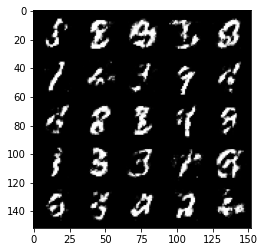

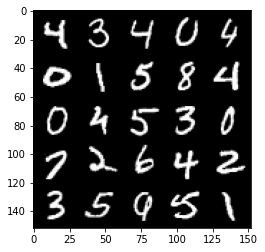

Step 1000: Generator loss: 1.3345005085468291, discriminator loss: 0.4568070783019069


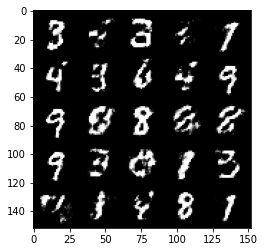

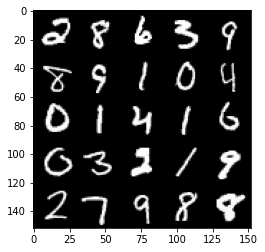

Step 1500: Generator loss: 1.2479322466850278, discriminator loss: 0.49043476796150204


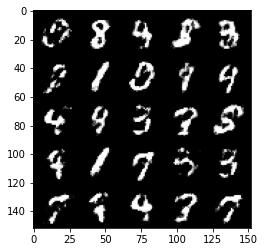

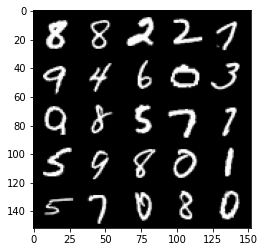

Step 2000: Generator loss: 1.2155297400951384, discriminator loss: 0.49194574302434946


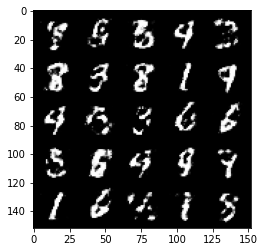

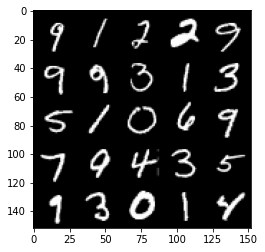

Step 2500: Generator loss: 1.1421152787208564, discriminator loss: 0.5288275758624079


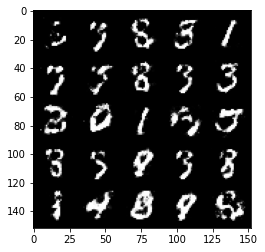

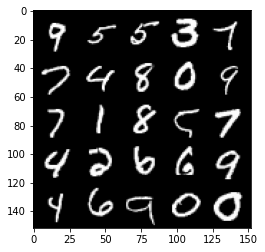

Step 3000: Generator loss: 1.1647932614088061, discriminator loss: 0.5062412800192831


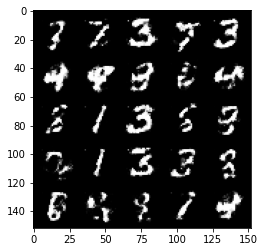

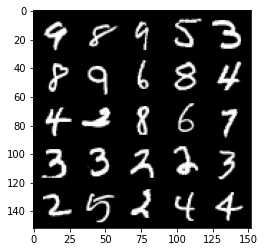

Step 3500: Generator loss: 1.235261777877809, discriminator loss: 0.4787153819799425


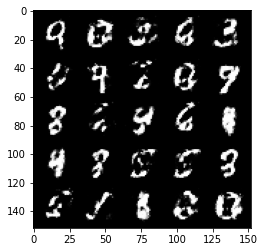

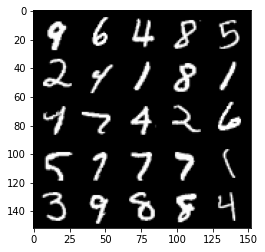

Step 4000: Generator loss: 1.2426269292831416, discriminator loss: 0.48595148968696644


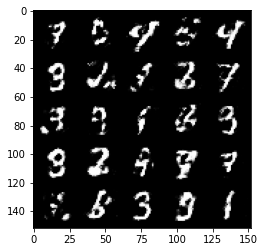

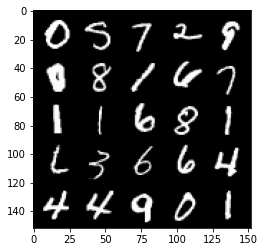

Step 4500: Generator loss: 1.2518964383602158, discriminator loss: 0.4810796468257907


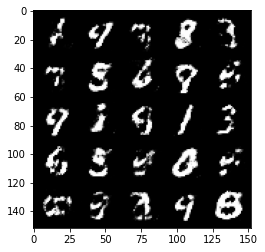

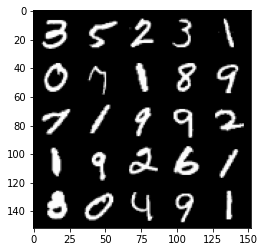

Step 5000: Generator loss: 1.1697976223230377, discriminator loss: 0.5058992109298708


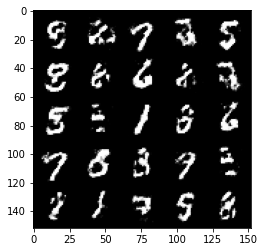

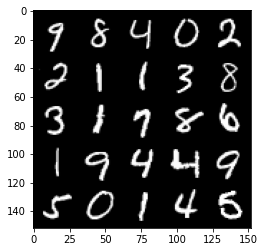

Step 5500: Generator loss: 1.2125617418289176, discriminator loss: 0.49682926762104057


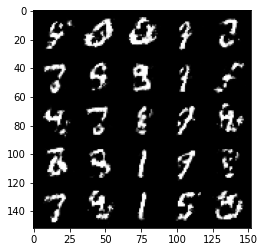

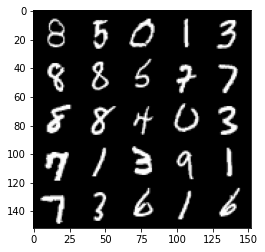

Step 6000: Generator loss: 1.1841828243732448, discriminator loss: 0.5087506130933763


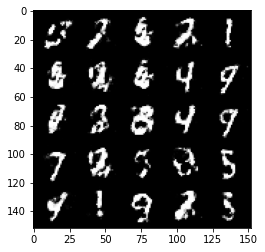

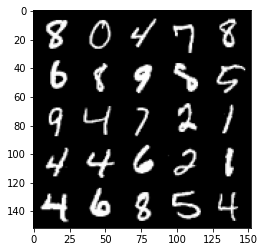

Step 6500: Generator loss: 1.1510757428407663, discriminator loss: 0.5175190521478653


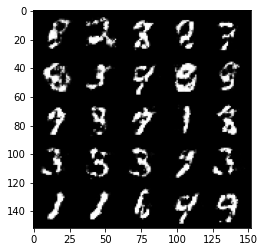

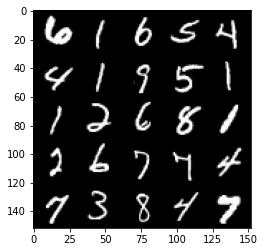

Step 7000: Generator loss: 1.1898964233398435, discriminator loss: 0.48155790513753877


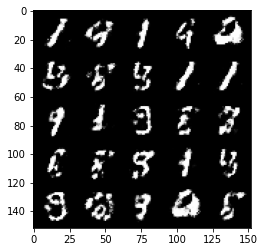

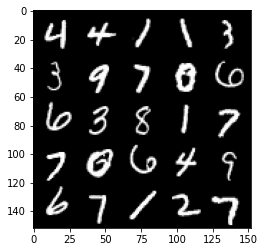

Step 7500: Generator loss: 1.2616899225711828, discriminator loss: 0.4693979707360267


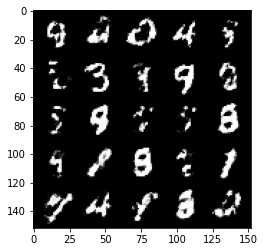

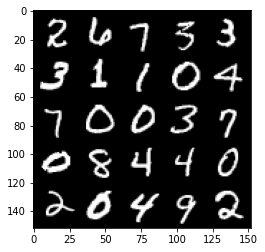

Step 8000: Generator loss: 1.2492835121154788, discriminator loss: 0.467170237600803


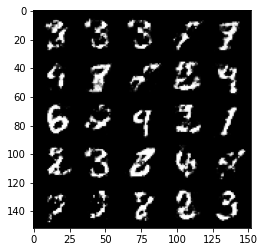

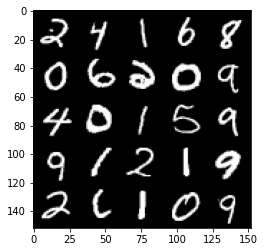

Step 8500: Generator loss: 1.2028764674663535, discriminator loss: 0.49516160172224033


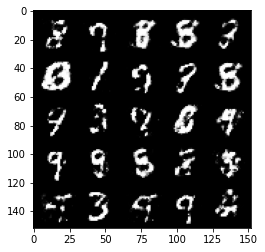

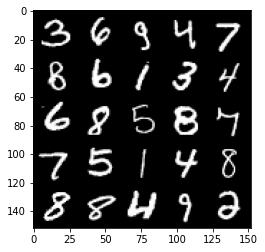

Step 9000: Generator loss: 1.2379712247848496, discriminator loss: 0.4721023404598235


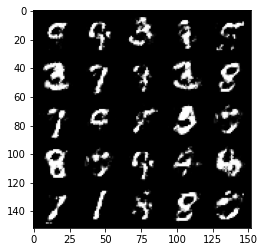

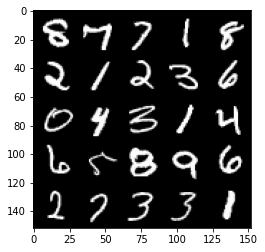

Step 9500: Generator loss: 1.146993762254715, discriminator loss: 0.5317387250065799


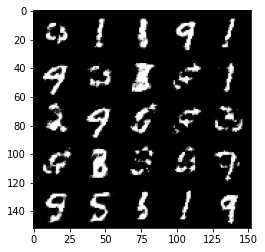

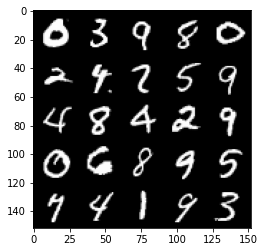

Step 10000: Generator loss: 1.1427755328416818, discriminator loss: 0.5091235161423683


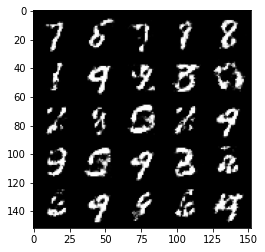

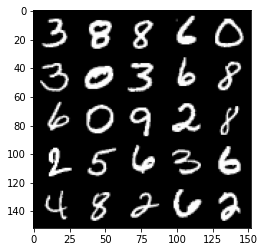

Step 10500: Generator loss: 1.1513215788602829, discriminator loss: 0.5133707262277605


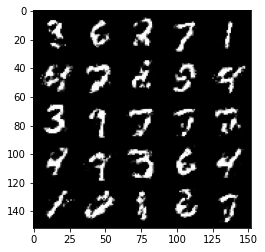

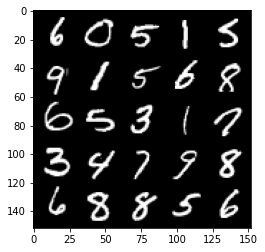

Step 11000: Generator loss: 1.169676400661469, discriminator loss: 0.5076891511678698


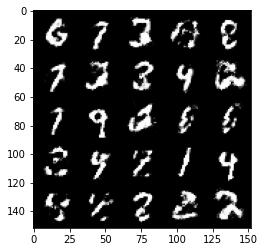

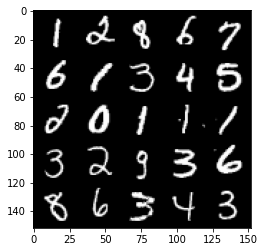

Step 11500: Generator loss: 1.1803474255800255, discriminator loss: 0.5084010186791416


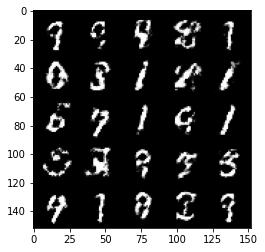

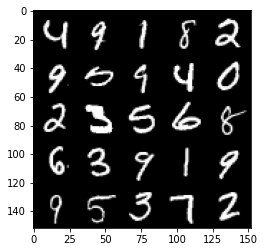

Step 12000: Generator loss: 1.169568930983544, discriminator loss: 0.5068887727856635


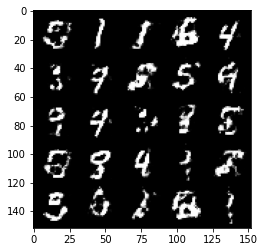

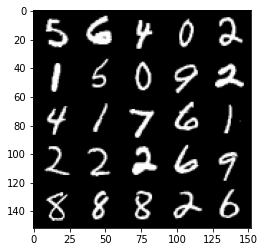

Step 12500: Generator loss: 1.1900136530399317, discriminator loss: 0.4994822738170626


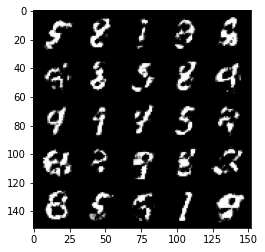

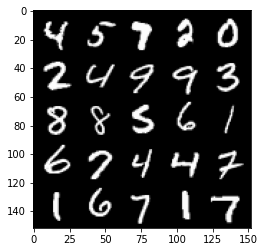

Step 13000: Generator loss: 1.17050279021263, discriminator loss: 0.5013180167078973


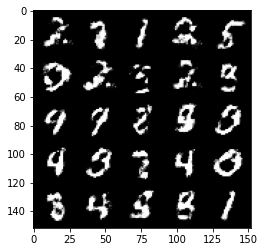

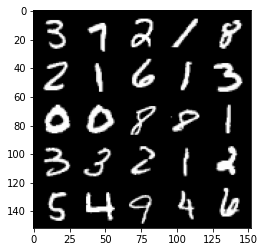

Step 13500: Generator loss: 1.1409195116758348, discriminator loss: 0.5072348541617394


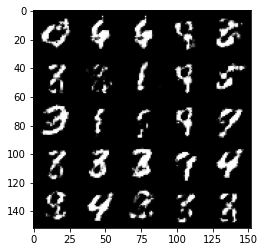

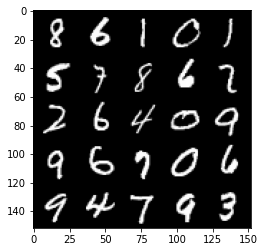

Step 14000: Generator loss: 1.1922110033035282, discriminator loss: 0.4842639549374578


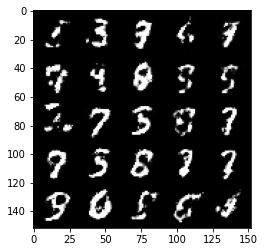

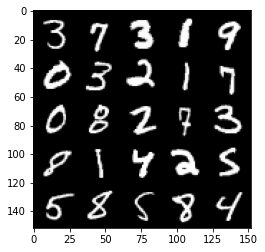

Step 14500: Generator loss: 1.2262584264278409, discriminator loss: 0.4764573615193364


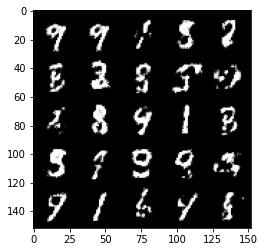

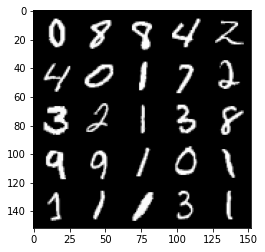

Step 15000: Generator loss: 1.2104209082126616, discriminator loss: 0.49565205103158944


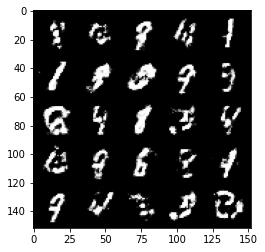

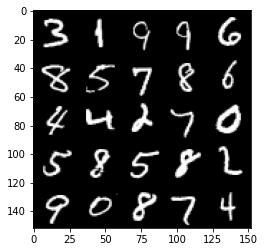

Step 15500: Generator loss: 0.8961396749019616, discriminator loss: 0.6879901736378663


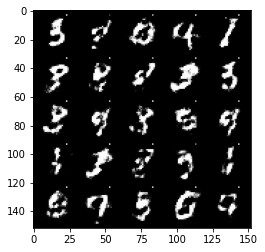

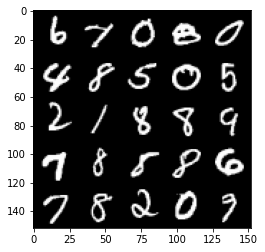

Step 16000: Generator loss: 1.21634164404869, discriminator loss: 0.44518026310205494


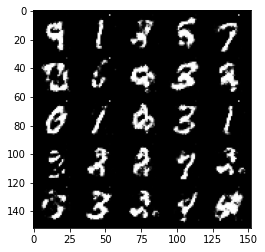

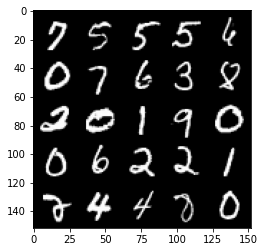

Step 16500: Generator loss: 1.277586606740953, discriminator loss: 0.4854061338305473


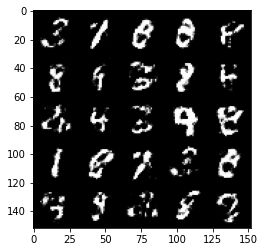

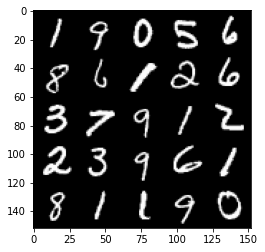

Step 17000: Generator loss: 1.194204662799835, discriminator loss: 0.498530766427517


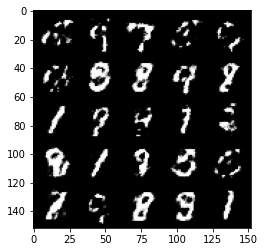

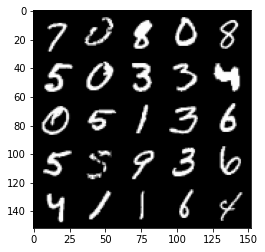

Step 17500: Generator loss: 1.2018653494119638, discriminator loss: 0.4895579257011411


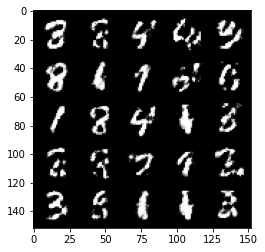

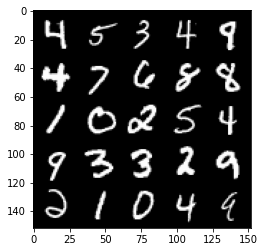

Step 18000: Generator loss: 1.222768534183503, discriminator loss: 0.4836635233163833


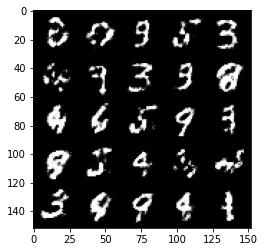

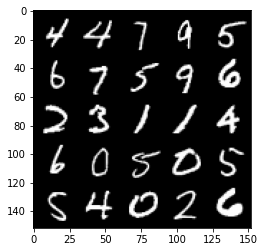

Step 18500: Generator loss: 1.1074461019039161, discriminator loss: 0.5168212142586711


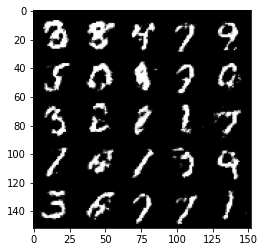

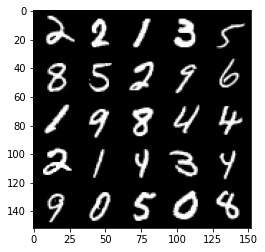

Step 19000: Generator loss: 1.1698380776643764, discriminator loss: 0.5040530567169189


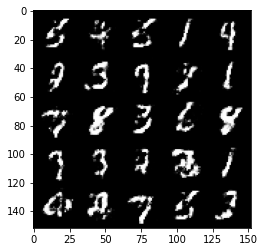

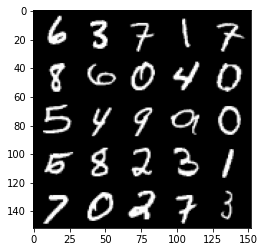

Step 19500: Generator loss: 1.1021248955726612, discriminator loss: 0.5122012840509419


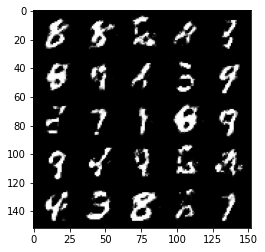

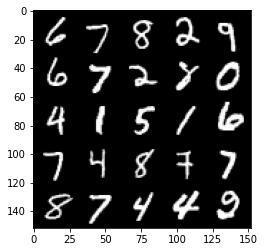

Step 20000: Generator loss: 1.093710620403289, discriminator loss: 0.5217041352391235


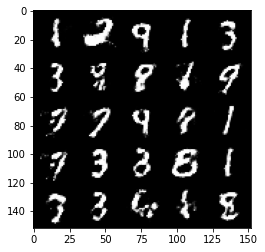

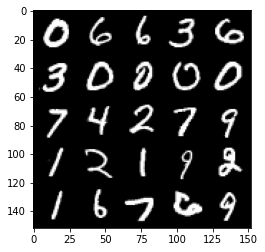

Step 20500: Generator loss: 1.1009494366645813, discriminator loss: 0.5271180126667022


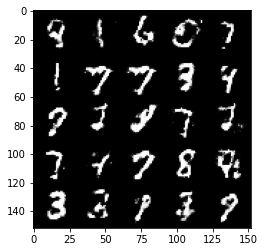

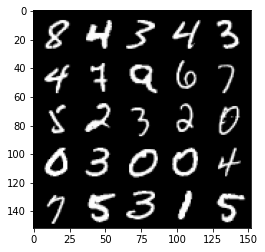

Step 21000: Generator loss: 1.0975787671804427, discriminator loss: 0.5281545761227612


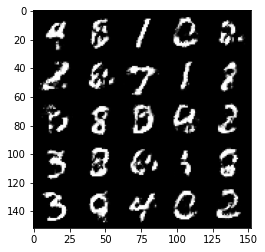

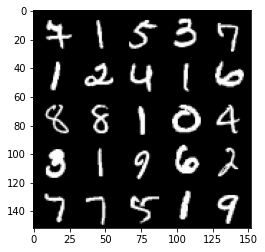

Step 21500: Generator loss: 1.0607441753149034, discriminator loss: 0.5442912086248395


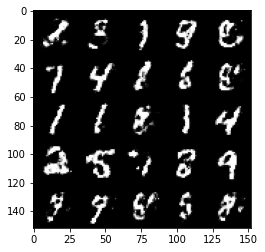

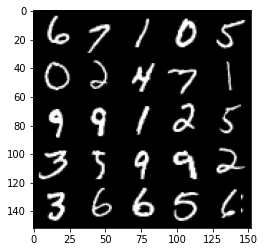

Step 22000: Generator loss: 1.016947921276093, discriminator loss: 0.56007438904047


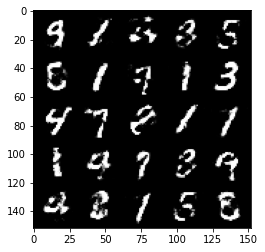

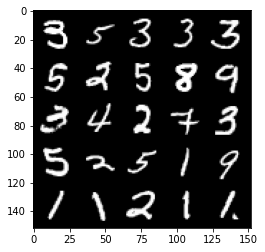

Step 22500: Generator loss: 1.0852272968292247, discriminator loss: 0.5249358124136926


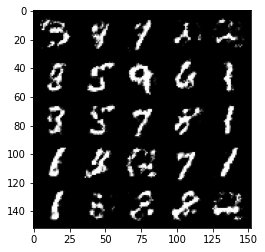

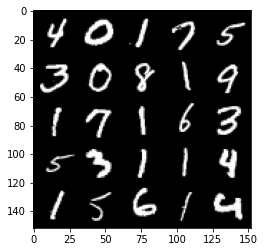

Step 23000: Generator loss: 1.073047341227531, discriminator loss: 0.5402271161079405


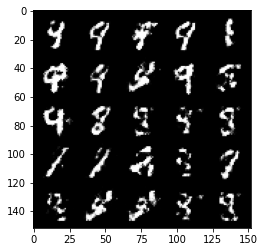

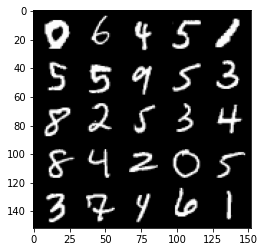

Step 23500: Generator loss: 0.9656509885787954, discriminator loss: 0.5735998792648318


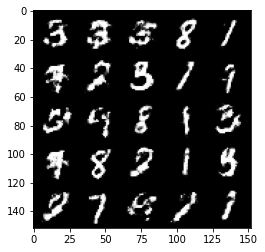

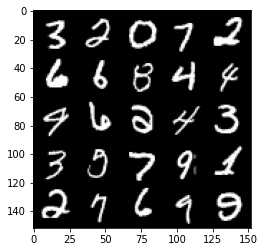

Step 24000: Generator loss: 0.969499745130539, discriminator loss: 0.5677733445167539


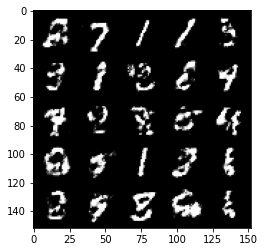

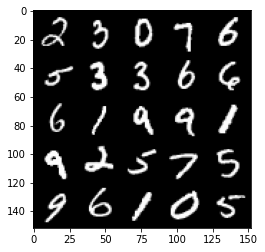

Step 24500: Generator loss: 1.0205986306667323, discriminator loss: 0.5540766538381576


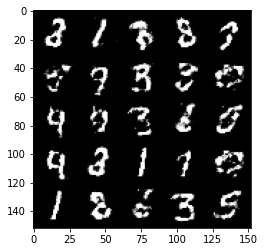

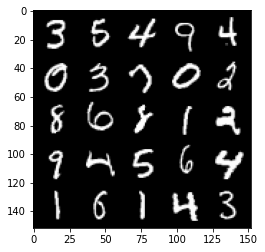

Step 25000: Generator loss: 1.01448361635208, discriminator loss: 0.557717035889626


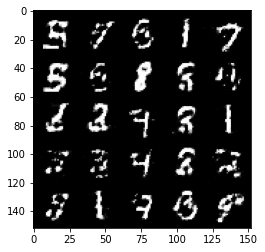

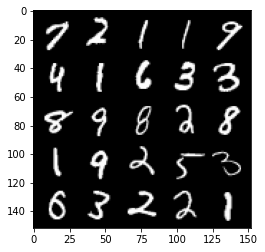

Step 25500: Generator loss: 0.9517667824029916, discriminator loss: 0.5800405781865119


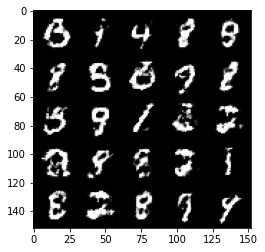

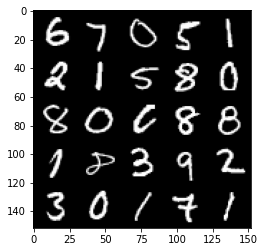

Step 26000: Generator loss: 1.0089426760673526, discriminator loss: 0.5605504838228217


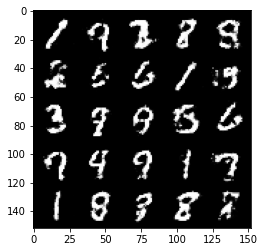

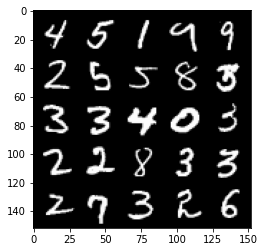

Step 26500: Generator loss: 0.9637953190803517, discriminator loss: 0.5807176125049593


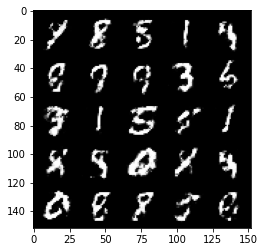

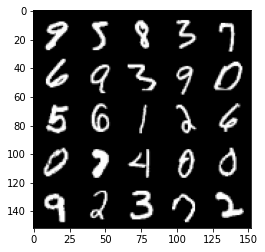

Step 27000: Generator loss: 0.933171677231788, discriminator loss: 0.5795481719970705


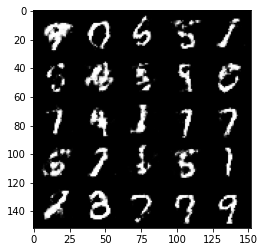

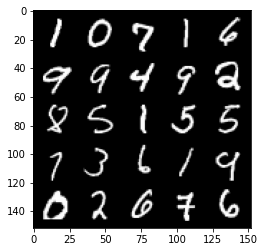

Step 27500: Generator loss: 1.0225168085098277, discriminator loss: 0.5446213895678514


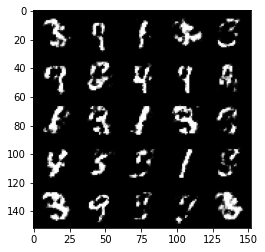

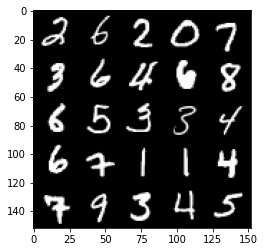

Step 28000: Generator loss: 1.0111372293233873, discriminator loss: 0.5462308894395825


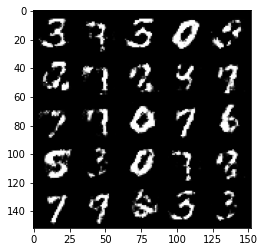

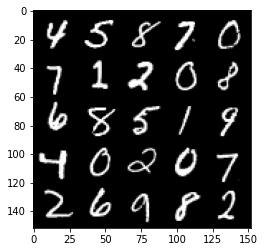

Step 28500: Generator loss: 0.9690078307390211, discriminator loss: 0.5726655592918403


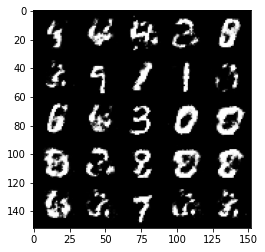

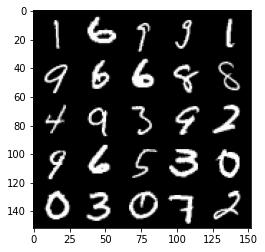

Step 29000: Generator loss: 0.9784253214597703, discriminator loss: 0.5590138236284258


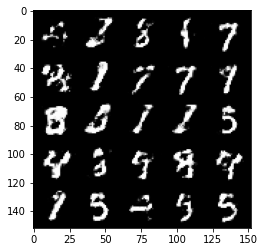

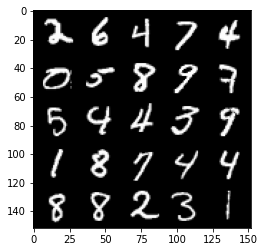

Step 29500: Generator loss: 0.9634593858718866, discriminator loss: 0.5609867510795594


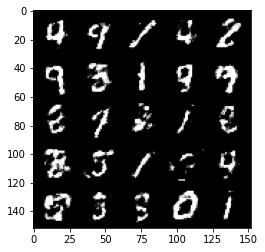

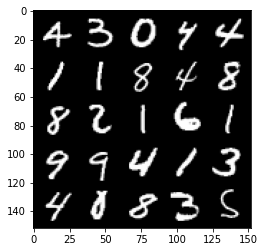

Step 30000: Generator loss: 0.9768115476369855, discriminator loss: 0.5595164952874185


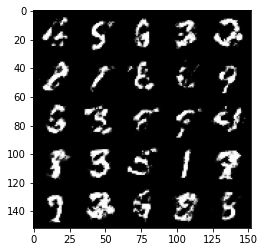

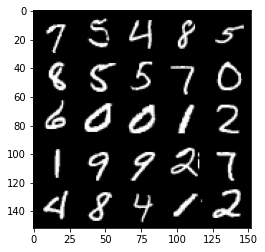

Step 30500: Generator loss: 1.0036588833332059, discriminator loss: 0.5584512757062913


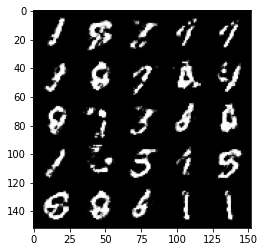

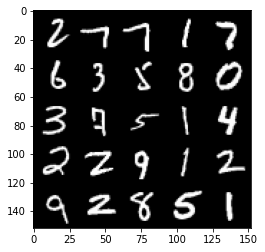

Step 31000: Generator loss: 1.0054861387014387, discriminator loss: 0.562344529271126


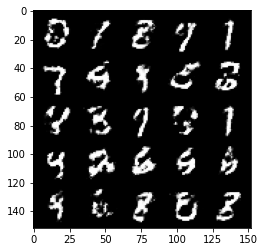

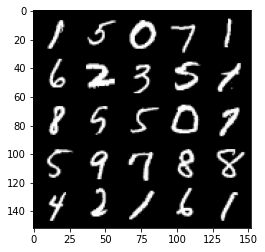

Step 31500: Generator loss: 0.9439870593547826, discriminator loss: 0.5932389798164373


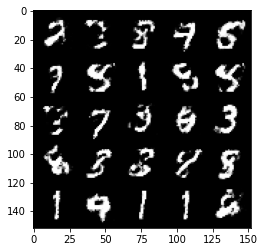

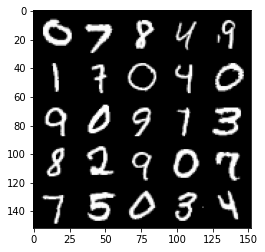

Step 32000: Generator loss: 0.9895063717365266, discriminator loss: 0.5661699204444889


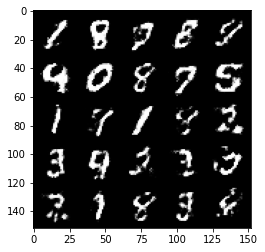

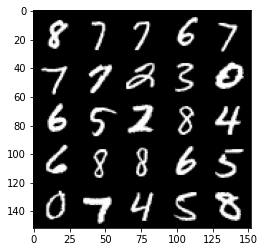

Step 32500: Generator loss: 0.9348161147832869, discriminator loss: 0.5701992365717891


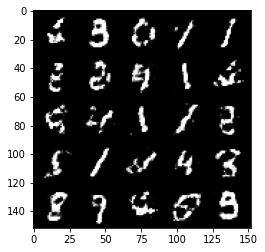

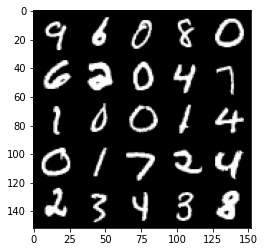

Step 33000: Generator loss: 0.9403419361114506, discriminator loss: 0.5805973829627039


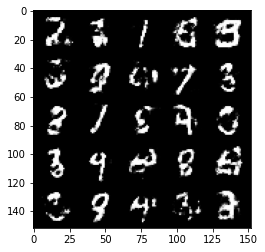

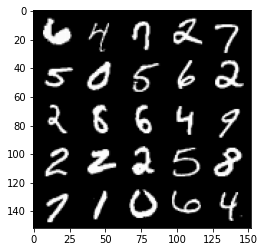

Step 33500: Generator loss: 0.9400142782926575, discriminator loss: 0.5828384660482407


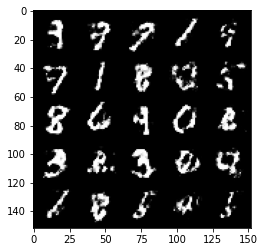

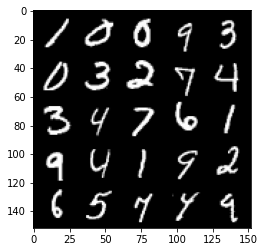

Step 34000: Generator loss: 0.9395968739986424, discriminator loss: 0.5825467058420188


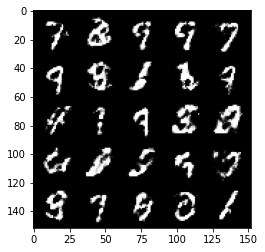

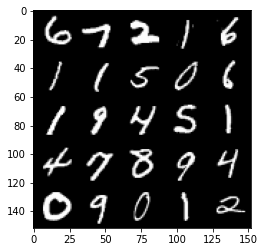

Step 34500: Generator loss: 0.9354422063827522, discriminator loss: 0.5884967664480204


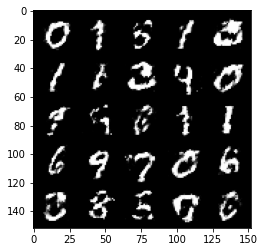

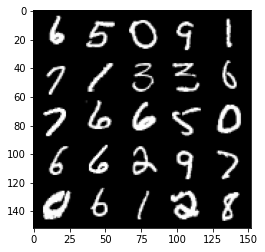

Step 35000: Generator loss: 0.9810919678211212, discriminator loss: 0.5568646148443225


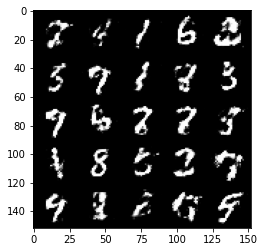

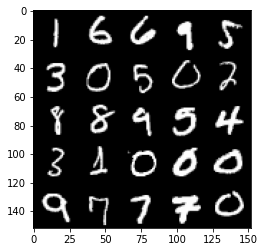

Step 35500: Generator loss: 0.9939611455202114, discriminator loss: 0.5560686483979226


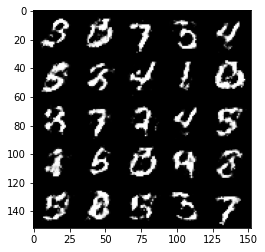

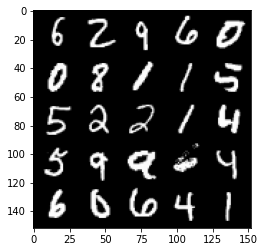

Step 36000: Generator loss: 1.045532977223395, discriminator loss: 0.5413897408246989


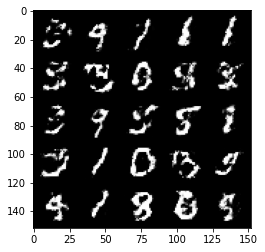

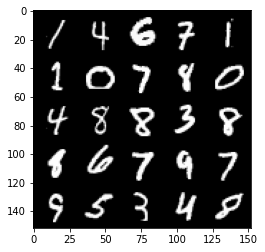

Step 36500: Generator loss: 0.9933758758306509, discriminator loss: 0.5519447006583214


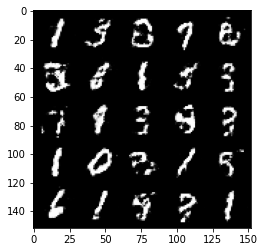

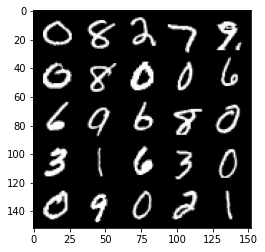

Step 37000: Generator loss: 0.968738685131073, discriminator loss: 0.5646983694434167


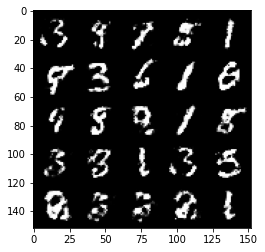

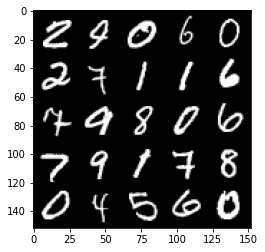

Step 37500: Generator loss: 0.9609829347133638, discriminator loss: 0.572574892222881


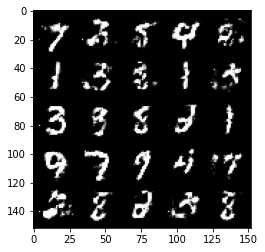

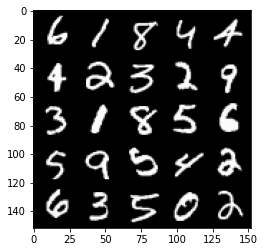

Step 38000: Generator loss: 1.0332774444818489, discriminator loss: 0.545159239172936


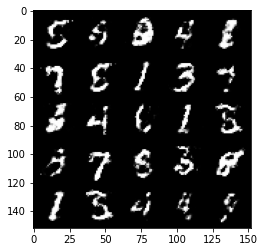

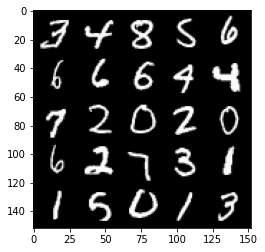

Step 38500: Generator loss: 1.0161188442707054, discriminator loss: 0.5422349249720576


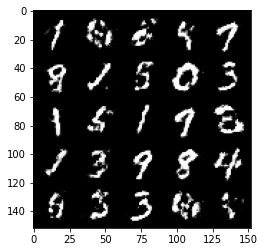

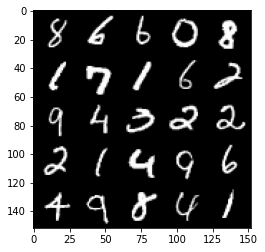

Step 39000: Generator loss: 0.9802281388044355, discriminator loss: 0.5686955060958861


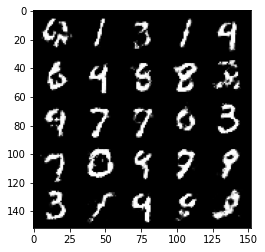

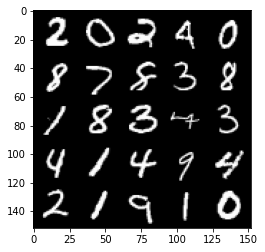

Step 39500: Generator loss: 0.8984192166328427, discriminator loss: 0.5937204979658125


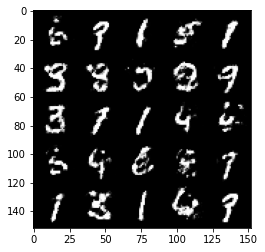

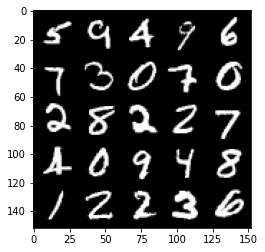

Step 40000: Generator loss: 0.9346670299768448, discriminator loss: 0.5759544696807855


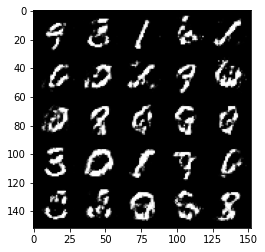

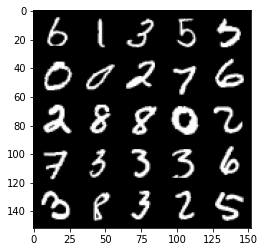

Step 40500: Generator loss: 0.9697897105216983, discriminator loss: 0.5774172567129128


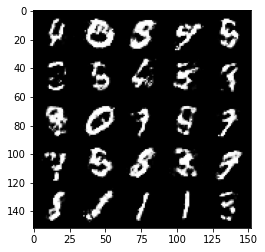

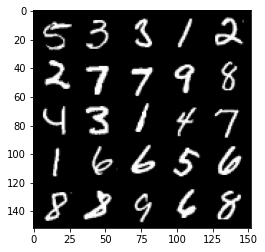

Step 41000: Generator loss: 0.9344315643310553, discriminator loss: 0.5852515050172808


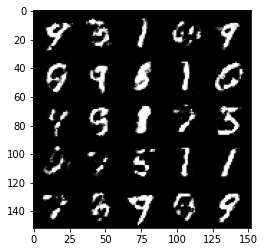

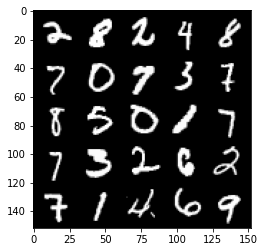

Step 41500: Generator loss: 0.9031889020204547, discriminator loss: 0.590188204050064


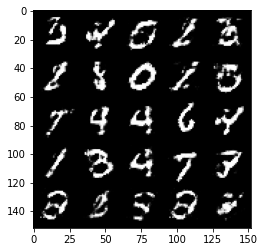

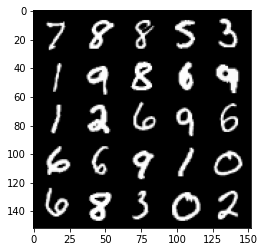

Step 42000: Generator loss: 0.9078308143615719, discriminator loss: 0.5873402979969976


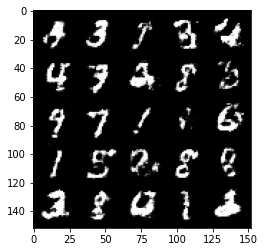

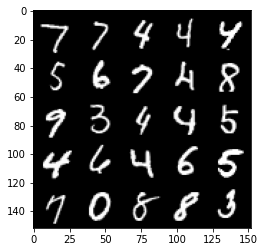

Step 42500: Generator loss: 0.9001870414018629, discriminator loss: 0.5993312469720844


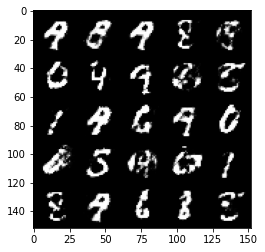

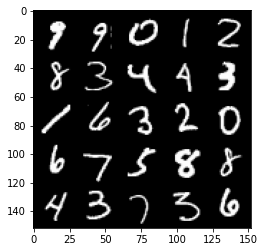

Step 43000: Generator loss: 0.959598456859588, discriminator loss: 0.5640406603217122


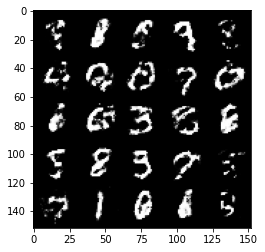

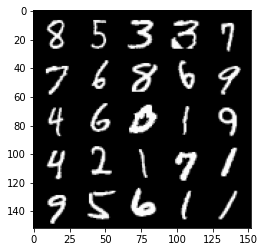

Step 43500: Generator loss: 0.9393085031509406, discriminator loss: 0.5694124610424046


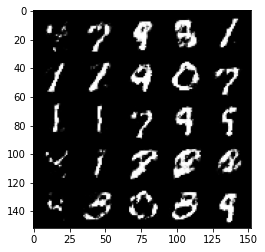

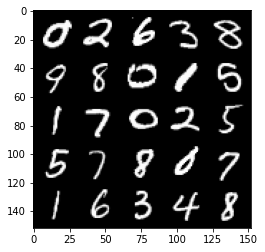

Step 44000: Generator loss: 0.9378073722124095, discriminator loss: 0.5578774901628494


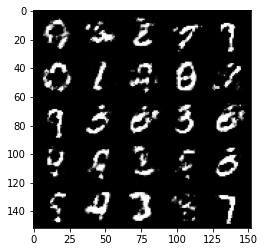

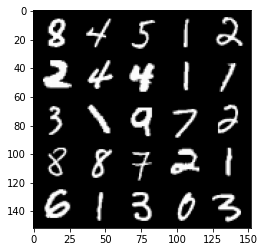

Step 44500: Generator loss: 0.8888090788125984, discriminator loss: 0.5913575508594512


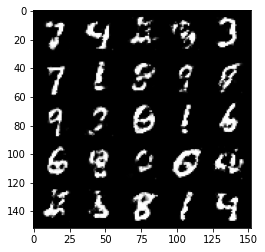

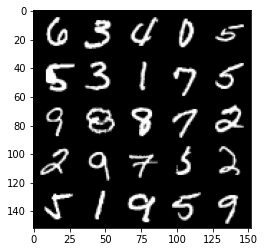

Step 45000: Generator loss: 0.9442401140928263, discriminator loss: 0.5784205332398418


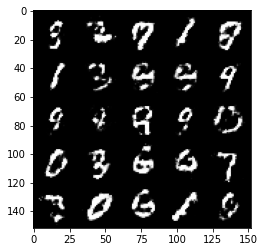

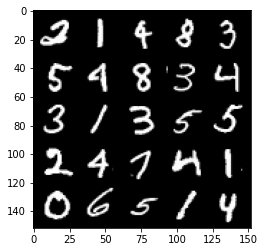

Step 45500: Generator loss: 0.8975877814292924, discriminator loss: 0.6047348672151573


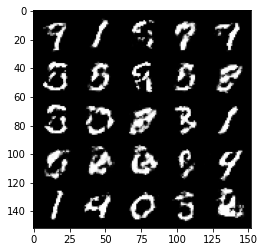

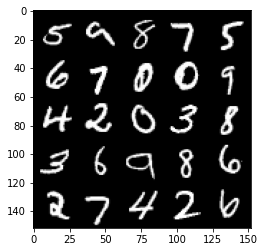

Step 46000: Generator loss: 0.8828149648904801, discriminator loss: 0.6075598479509354


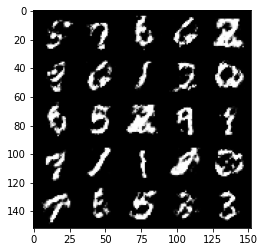

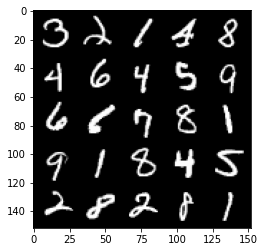

Step 46500: Generator loss: 0.890912380218506, discriminator loss: 0.5881407045125963


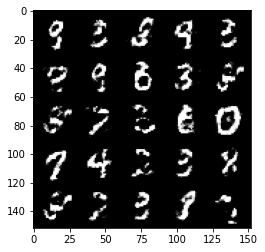

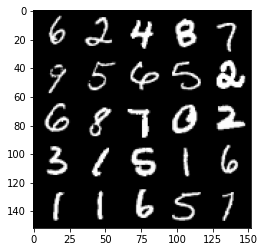

Step 47000: Generator loss: 0.9191793643236148, discriminator loss: 0.5883805897831919


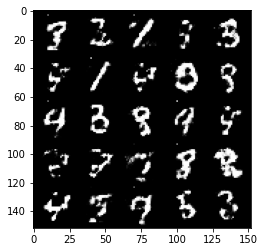

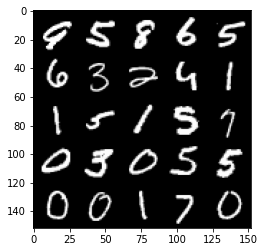

Step 47500: Generator loss: 0.953732529282571, discriminator loss: 0.5583609834313391


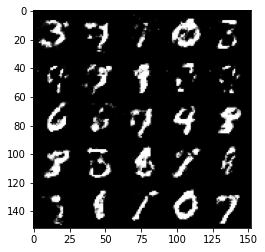

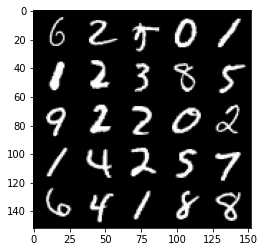

Step 48000: Generator loss: 0.9470857195854189, discriminator loss: 0.56273213082552


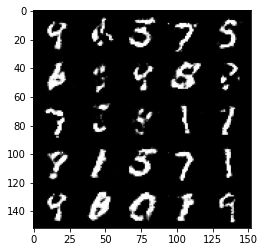

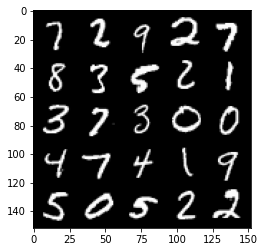

Step 48500: Generator loss: 0.9447460110187526, discriminator loss: 0.5727052382826806


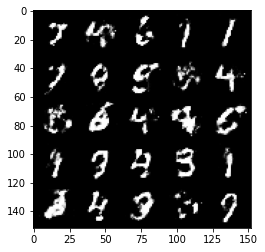

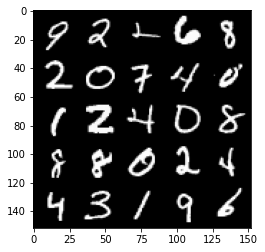

Step 49000: Generator loss: 0.8907963932752611, discriminator loss: 0.5915659123659128


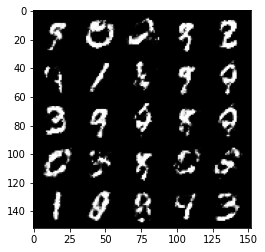

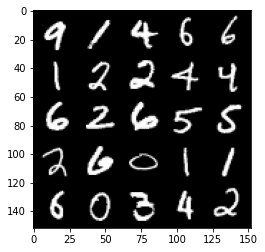

Step 49500: Generator loss: 0.8793867958784106, discriminator loss: 0.5962566819190971


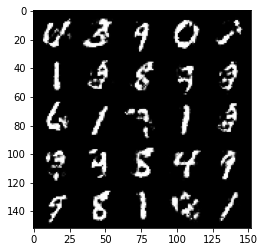

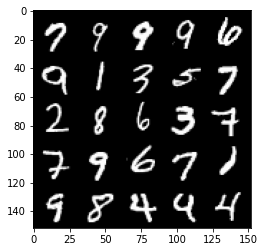

Step 50000: Generator loss: 0.9355534497499466, discriminator loss: 0.5892197948694234


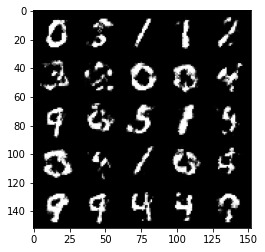

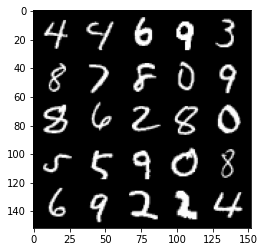

Step 50500: Generator loss: 0.9746626689434053, discriminator loss: 0.5757716631889345


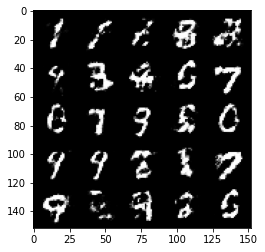

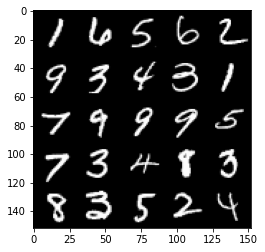

Step 51000: Generator loss: 0.8868579282760618, discriminator loss: 0.606757671713829


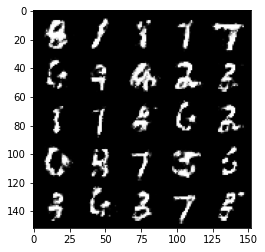

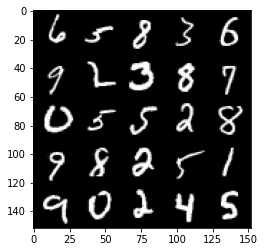

Step 51500: Generator loss: 0.8983911336660386, discriminator loss: 0.592530767560005


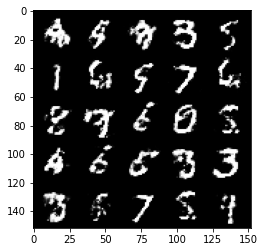

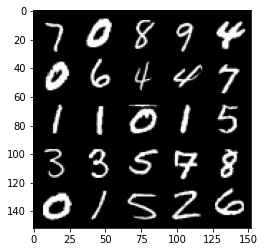

Step 52000: Generator loss: 0.8663977708816534, discriminator loss: 0.6154778953790662


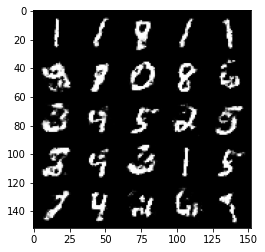

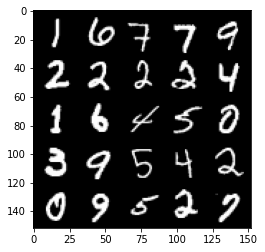

Step 52500: Generator loss: 0.8996848194599154, discriminator loss: 0.5891313506960867


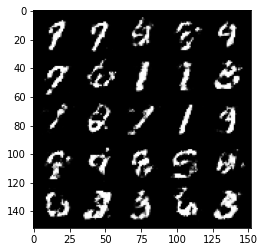

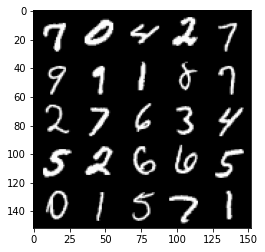

Step 53000: Generator loss: 0.9517582929134369, discriminator loss: 0.5737645139098169


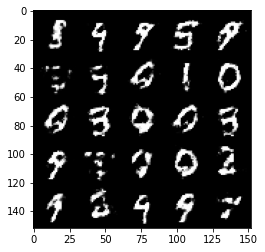

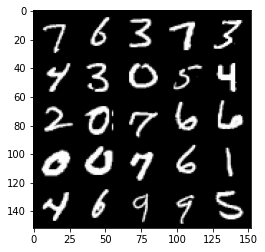

Step 53500: Generator loss: 0.9483543268442146, discriminator loss: 0.5781023843288422


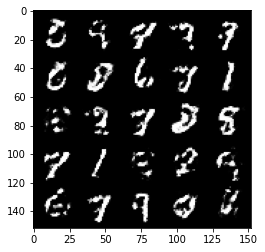

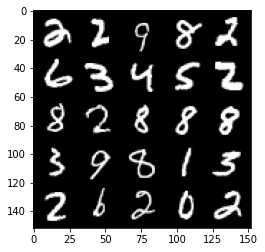

Step 54000: Generator loss: 0.9377818782329558, discriminator loss: 0.5813997966051103


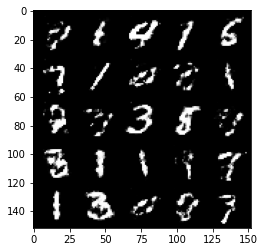

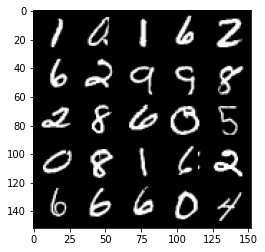

Step 54500: Generator loss: 0.9423512609004977, discriminator loss: 0.568886904001236


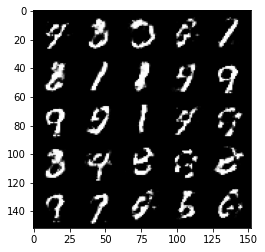

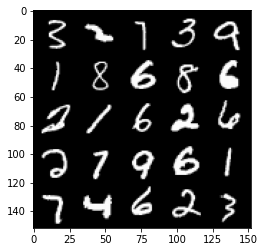

Step 55000: Generator loss: 0.9468113291263587, discriminator loss: 0.5770961951613429


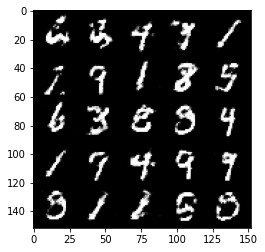

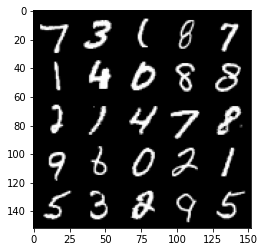

Step 55500: Generator loss: 0.895286510944367, discriminator loss: 0.5998820840120314


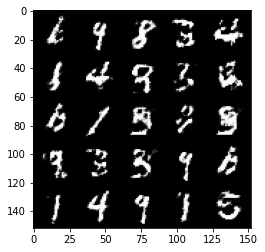

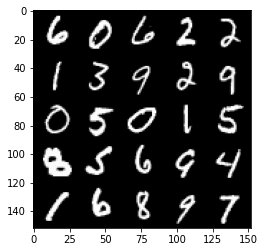

Step 56000: Generator loss: 0.8545935975313185, discriminator loss: 0.6214898717403414


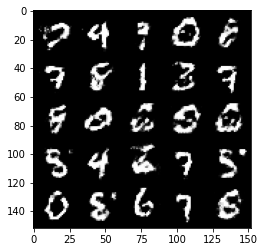

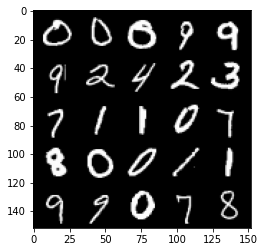

Step 56500: Generator loss: 0.8480175216197968, discriminator loss: 0.613809512495994


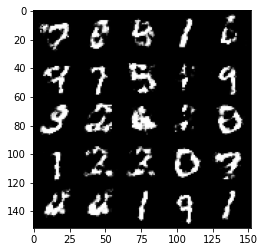

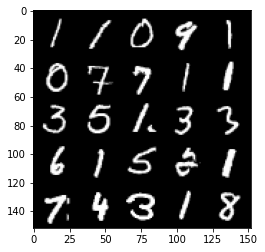

Step 57000: Generator loss: 0.8584315742254257, discriminator loss: 0.611553308844566


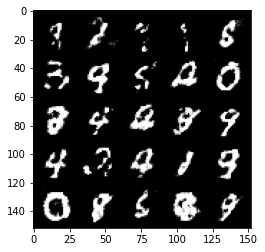

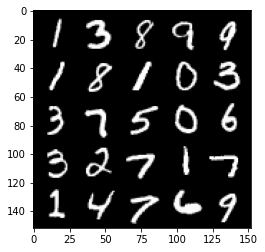

Step 57500: Generator loss: 0.8899793870449071, discriminator loss: 0.5879173502922067


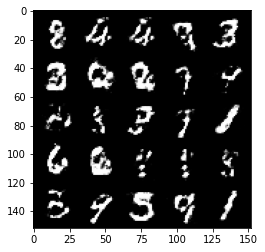

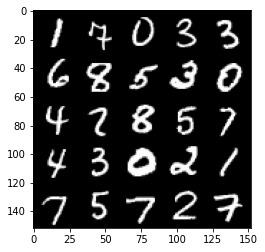

Step 58000: Generator loss: 0.8893525032997135, discriminator loss: 0.5901148450970654


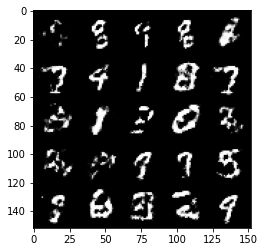

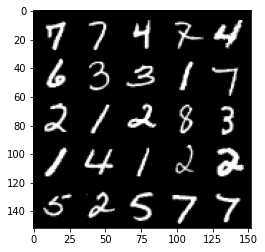

Step 58500: Generator loss: 0.9125873692035675, discriminator loss: 0.5829399056434627


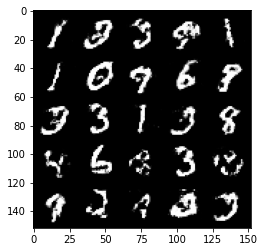

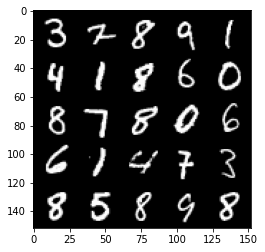

Step 59000: Generator loss: 0.9141148684024811, discriminator loss: 0.5877853209972382


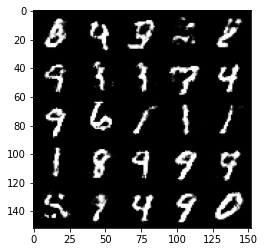

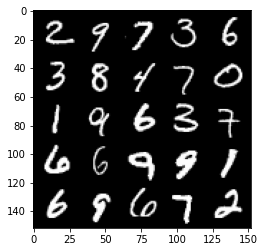

Step 59500: Generator loss: 0.9037057776451115, discriminator loss: 0.5901001147031794


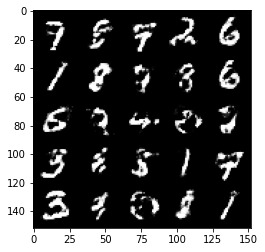

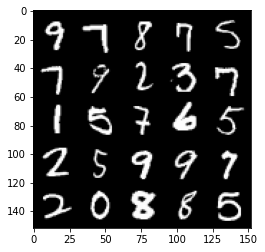

Step 60000: Generator loss: 0.8788162637949001, discriminator loss: 0.6057985743284224


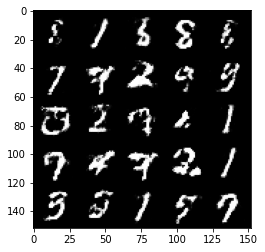

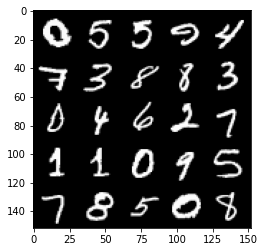

Step 60500: Generator loss: 0.8464029979705807, discriminator loss: 0.6112011930942536


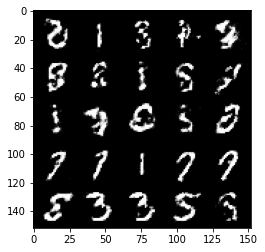

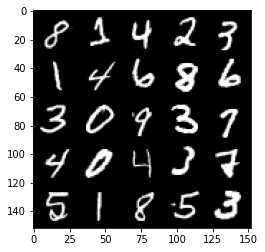

Step 61000: Generator loss: 0.8245187592506411, discriminator loss: 0.6326335762739181


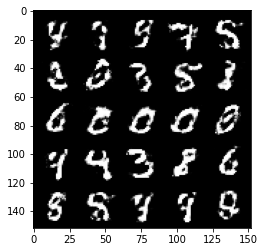

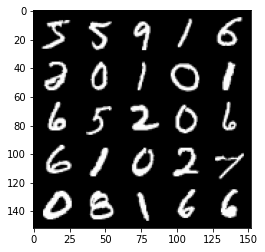

Step 61500: Generator loss: 0.8595068006515493, discriminator loss: 0.6143967514038083


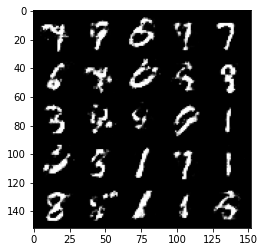

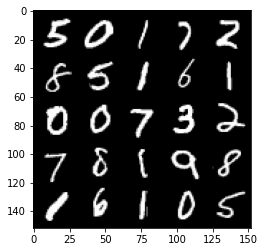

Step 62000: Generator loss: 0.8659623677730559, discriminator loss: 0.6107951065301899


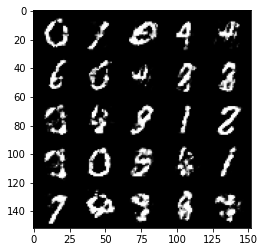

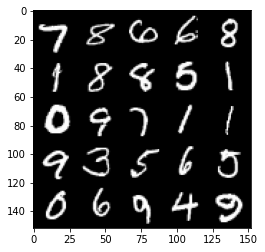

Step 62500: Generator loss: 0.8788794320821758, discriminator loss: 0.6024911670684816


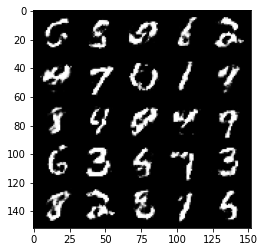

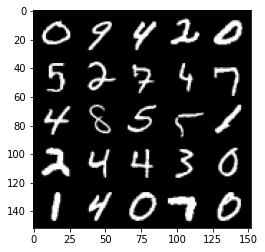

Step 63000: Generator loss: 0.9412081824541086, discriminator loss: 0.5790537075996396


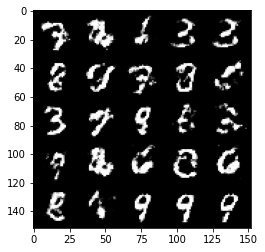

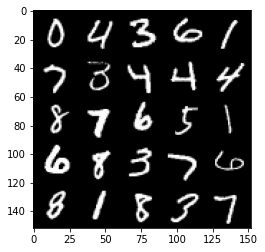

Step 63500: Generator loss: 0.8869500950574872, discriminator loss: 0.602911071658135


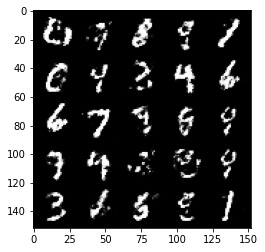

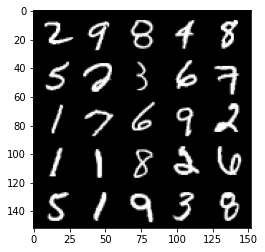

Step 64000: Generator loss: 0.8799536571502685, discriminator loss: 0.604574097633362


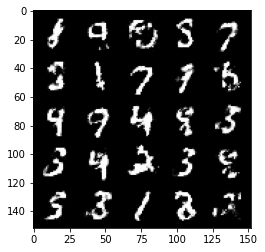

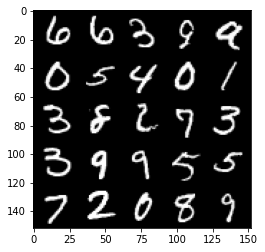

Step 64500: Generator loss: 0.8853715585470199, discriminator loss: 0.6002353549003603


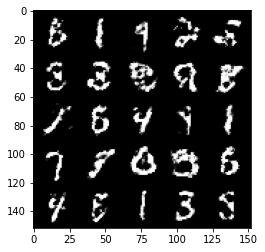

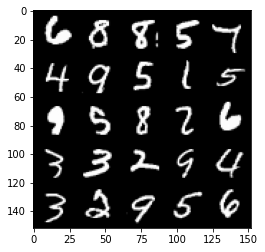

Step 65000: Generator loss: 0.846624509453773, discriminator loss: 0.6113392531871793


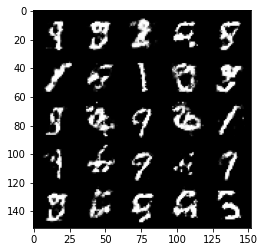

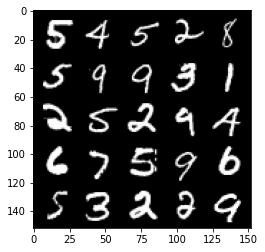

Step 65500: Generator loss: 0.9037166508436202, discriminator loss: 0.5817656894922253


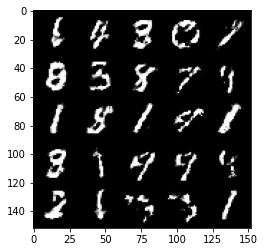

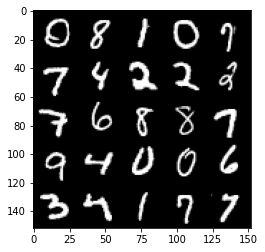

Step 66000: Generator loss: 0.8975976490974431, discriminator loss: 0.5915368388891225


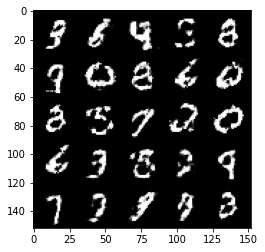

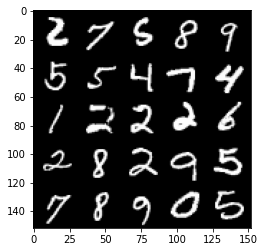

Step 66500: Generator loss: 0.8738103262186059, discriminator loss: 0.5985975131988527


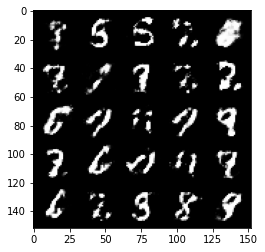

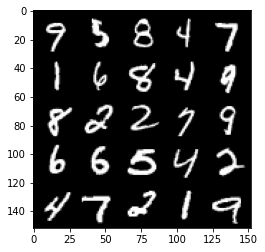

Step 67000: Generator loss: 0.8747793662548065, discriminator loss: 0.6115339777469639


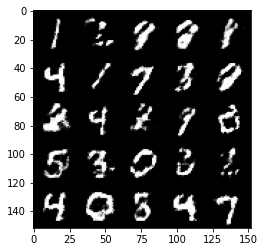

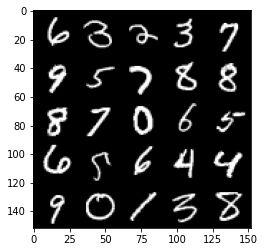

Step 67500: Generator loss: 0.9165326753854746, discriminator loss: 0.5838025370240213


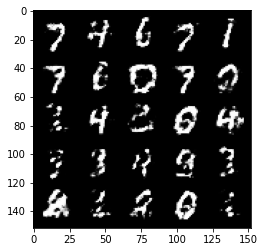

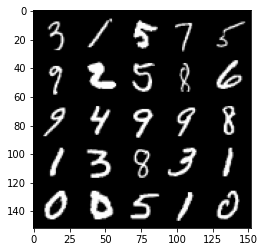

Step 68000: Generator loss: 0.9390316202640535, discriminator loss: 0.5726843487024306


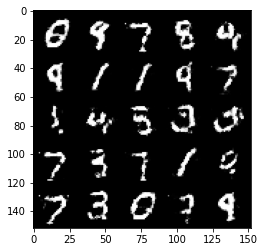

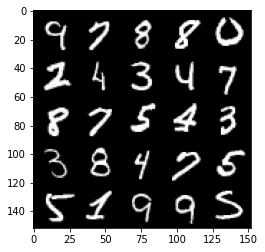

Step 68500: Generator loss: 0.8815559659004214, discriminator loss: 0.6101717420816425


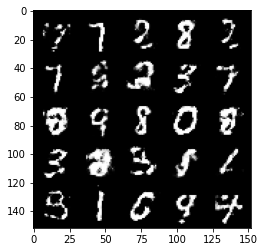

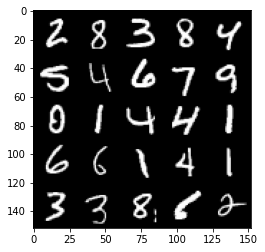

Step 69000: Generator loss: 0.8705066112279894, discriminator loss: 0.6147546719312665


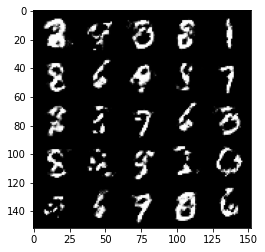

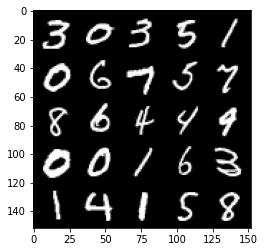

Step 69500: Generator loss: 0.8960109438896178, discriminator loss: 0.6043150924444199


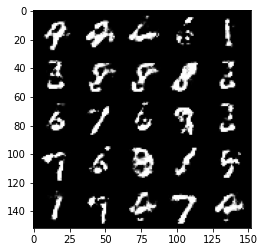

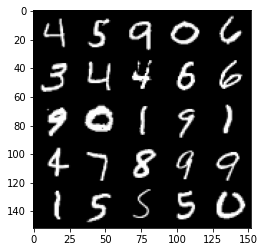

Step 70000: Generator loss: 0.9004826498031614, discriminator loss: 0.59314346063137


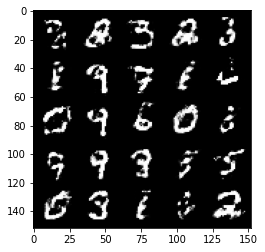

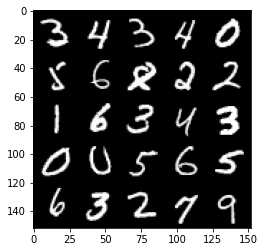

Step 70500: Generator loss: 0.9396845178604123, discriminator loss: 0.5795495333075529


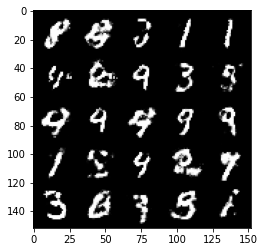

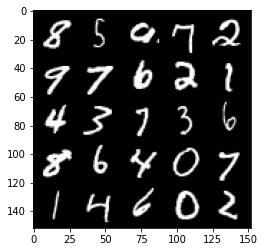

Step 71000: Generator loss: 0.9269984902143484, discriminator loss: 0.5897932731509212


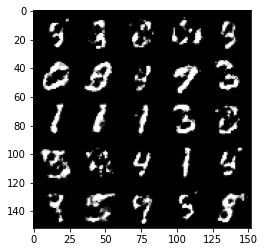

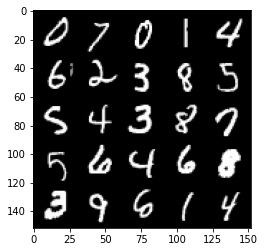

Step 71500: Generator loss: 0.8868216077089309, discriminator loss: 0.5886587811708457


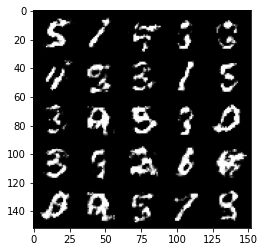

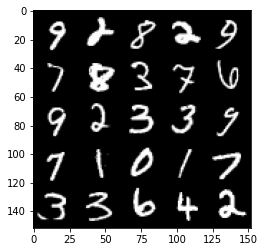

Step 72000: Generator loss: 0.9222794153690343, discriminator loss: 0.5858585709333424


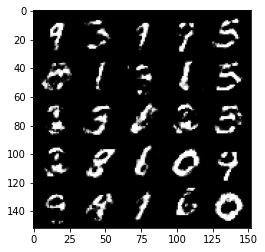

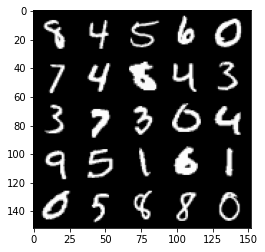

Step 72500: Generator loss: 0.9064122619628907, discriminator loss: 0.5913856472969056


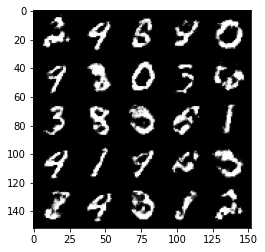

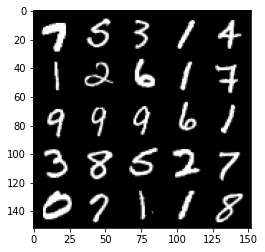

Step 73000: Generator loss: 0.8838921412229537, discriminator loss: 0.5959428833723065


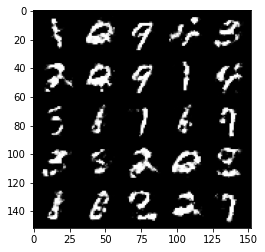

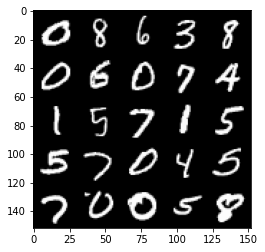

Step 73500: Generator loss: 0.9151942930221558, discriminator loss: 0.5760469805002219


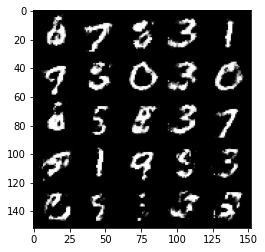

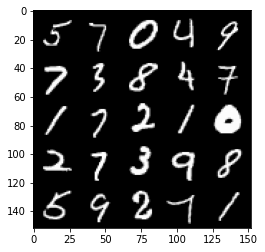

Step 74000: Generator loss: 0.9081384081840509, discriminator loss: 0.5955912184715267


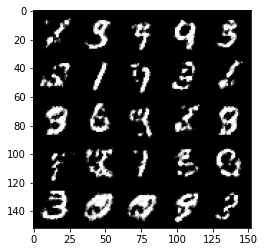

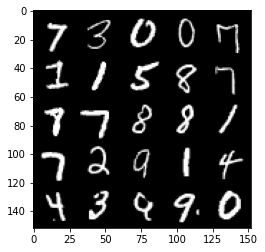

Step 74500: Generator loss: 0.9024052350521093, discriminator loss: 0.5987707575559615


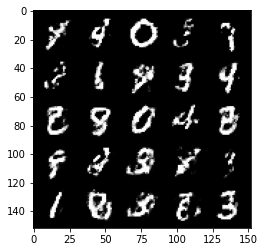

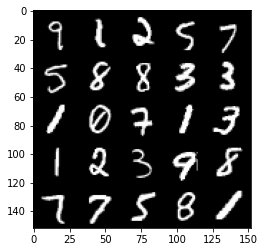

Step 75000: Generator loss: 0.8703594717979423, discriminator loss: 0.6126157010793682


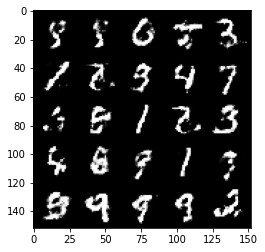

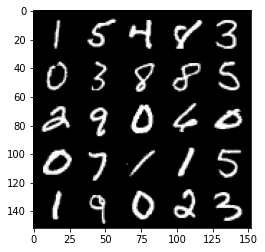

Step 75500: Generator loss: 0.8561299121379857, discriminator loss: 0.6122209951877595


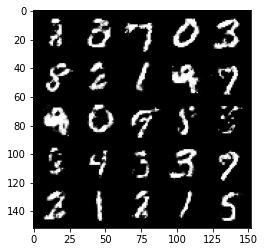

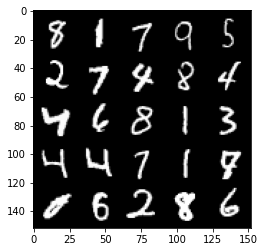

Step 76000: Generator loss: 0.8597638336420056, discriminator loss: 0.6112833621501922


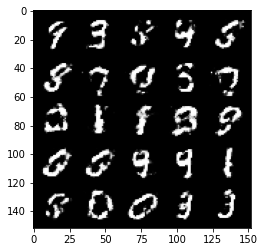

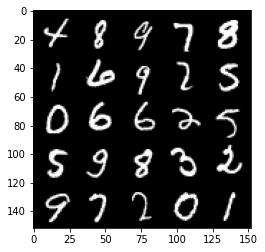

Step 76500: Generator loss: 0.9390578403472901, discriminator loss: 0.5827827195525174


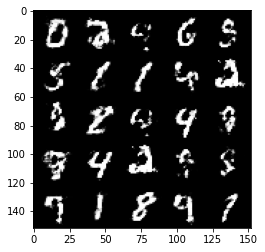

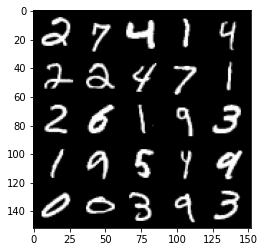

Step 77000: Generator loss: 0.9358949798345556, discriminator loss: 0.5826879537105563


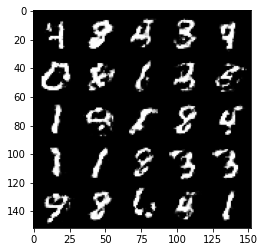

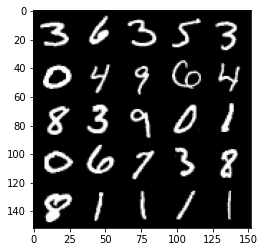

Step 77500: Generator loss: 0.9323102227449411, discriminator loss: 0.5892727103233337


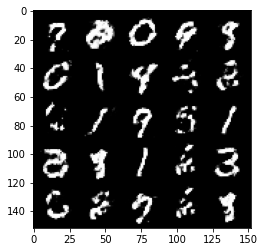

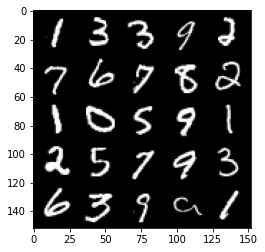

Step 78000: Generator loss: 0.941260283827781, discriminator loss: 0.5804455305337909


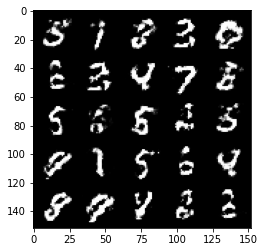

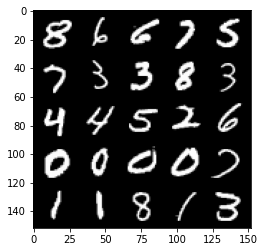

Step 78500: Generator loss: 0.9643015112876898, discriminator loss: 0.5753467020392423


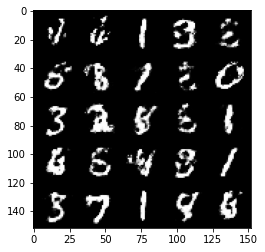

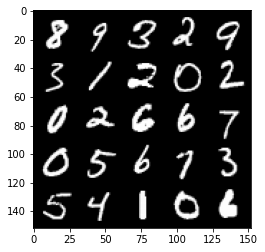

Step 79000: Generator loss: 0.9568279757499689, discriminator loss: 0.5714292321205138


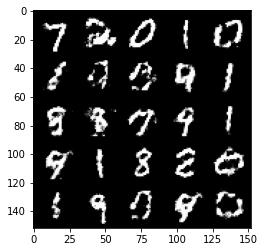

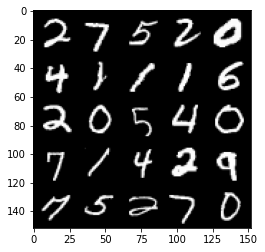

Step 79500: Generator loss: 0.8824104508161543, discriminator loss: 0.5999165239334111


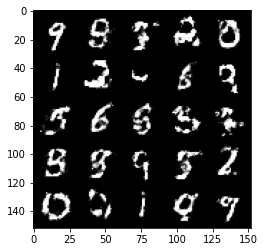

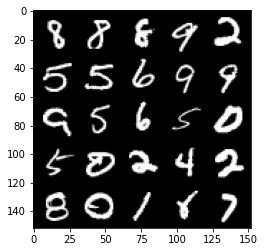

Step 80000: Generator loss: 0.8673066937923428, discriminator loss: 0.6101114966869359


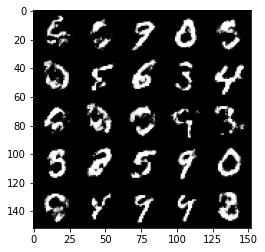

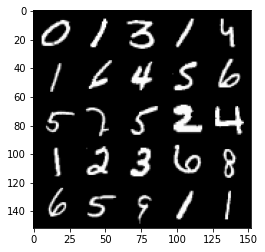

Step 80500: Generator loss: 0.867553914189339, discriminator loss: 0.6084330947399142


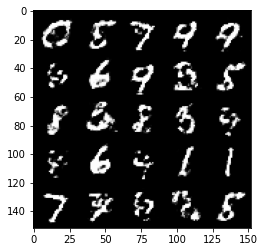

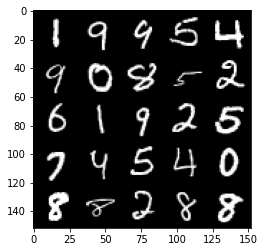

Step 81000: Generator loss: 0.8543702813386915, discriminator loss: 0.6042007744312284


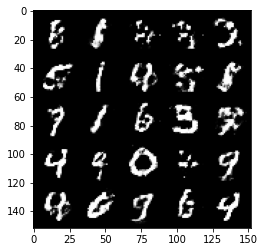

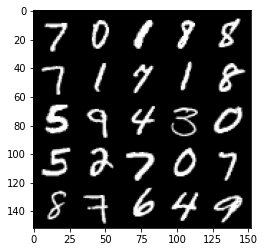

Step 81500: Generator loss: 0.8703493797779084, discriminator loss: 0.6120476332902911


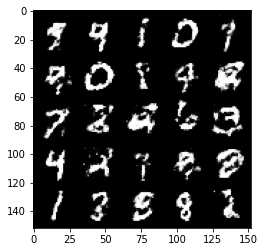

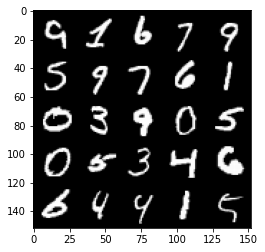

Step 82000: Generator loss: 0.853853234052658, discriminator loss: 0.6294438632726667


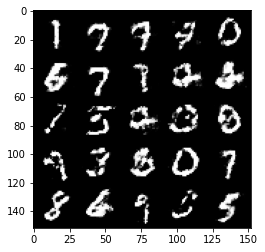

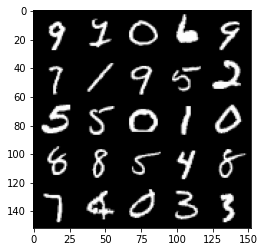

Step 82500: Generator loss: 0.8481359633207317, discriminator loss: 0.6185975865125655


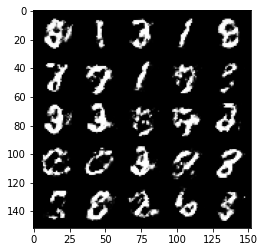

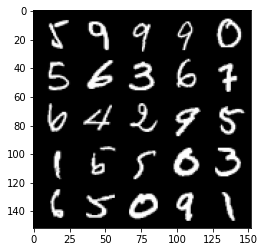

Step 83000: Generator loss: 0.8707977255582812, discriminator loss: 0.6077454147338869


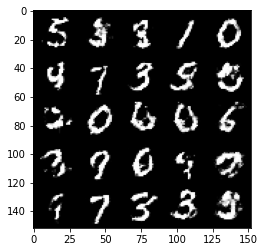

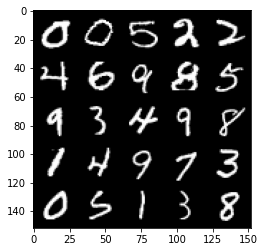

Step 83500: Generator loss: 0.8715108324289317, discriminator loss: 0.6141948205232621


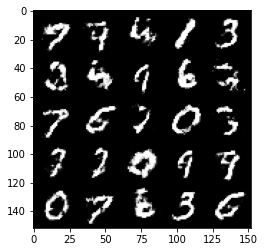

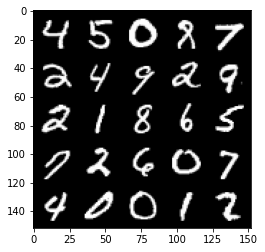

Step 84000: Generator loss: 0.8565629156827932, discriminator loss: 0.6229029825925835


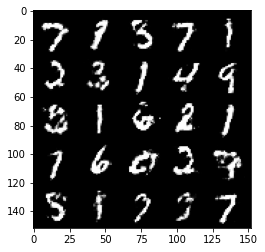

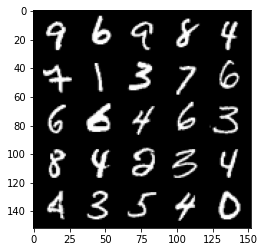

Step 84500: Generator loss: 0.8762675194740297, discriminator loss: 0.6082216483354564


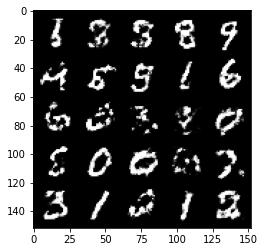

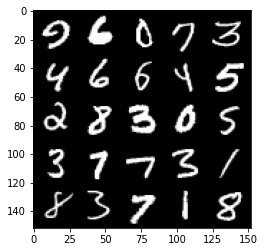

Step 85000: Generator loss: 0.8607814481258382, discriminator loss: 0.6038030430078503


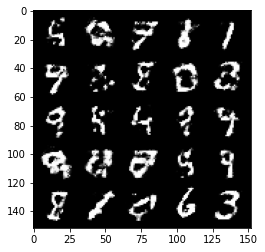

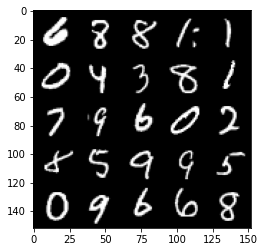

Step 85500: Generator loss: 0.912133242607117, discriminator loss: 0.6004518599510189


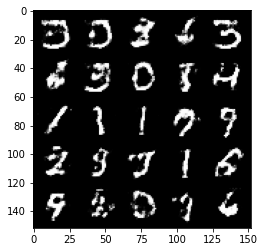

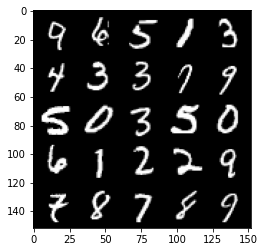

Step 86000: Generator loss: 0.8825274871587758, discriminator loss: 0.6077629734277723


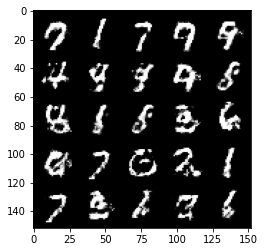

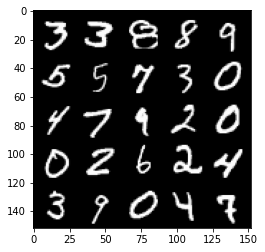

Step 86500: Generator loss: 0.8781126595735549, discriminator loss: 0.6065544586181643


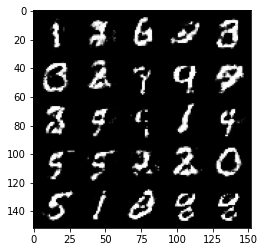

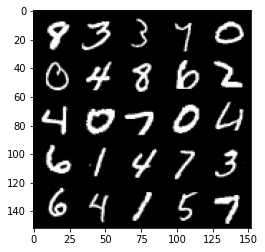

Step 87000: Generator loss: 0.8911636025905607, discriminator loss: 0.6036345471143725


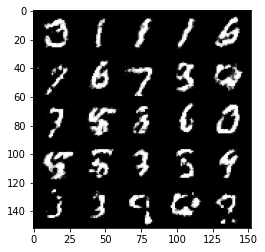

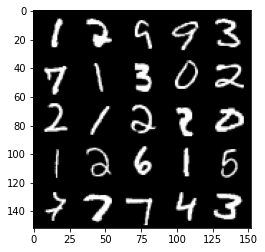

Step 87500: Generator loss: 0.9344432013034826, discriminator loss: 0.5873988251686093


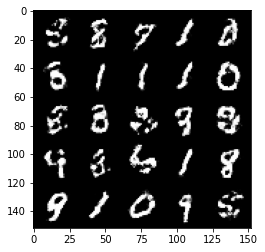

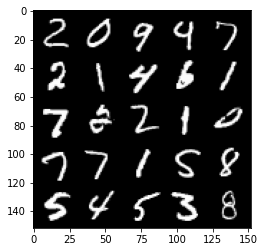

Step 88000: Generator loss: 0.8407350039482117, discriminator loss: 0.6218038773536677


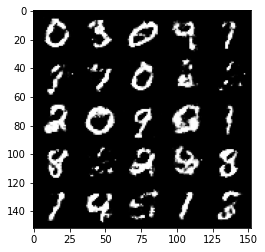

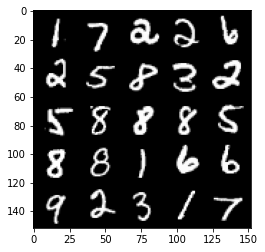

Step 88500: Generator loss: 0.9058512670993791, discriminator loss: 0.5880755761861796


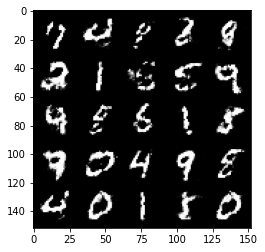

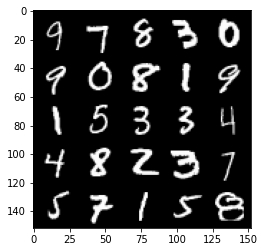

Step 89000: Generator loss: 0.8745287061929699, discriminator loss: 0.6108086690902711


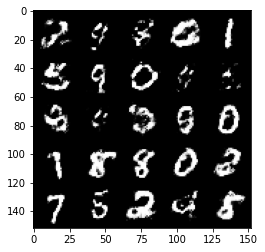

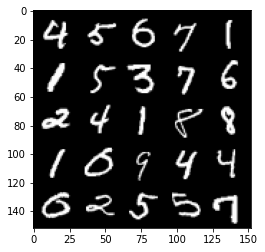

Step 89500: Generator loss: 0.8636796067953114, discriminator loss: 0.6095312719345097


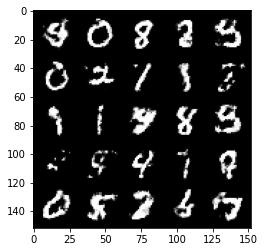

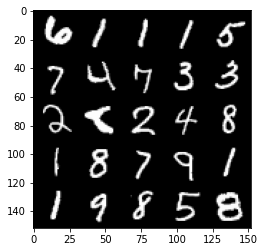

Step 90000: Generator loss: 0.8696291776895523, discriminator loss: 0.6063904845714571


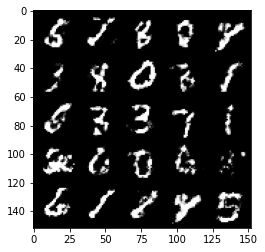

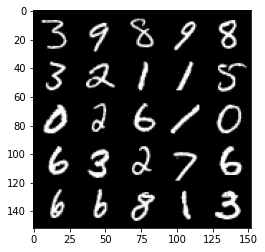

Step 90500: Generator loss: 0.854348484516144, discriminator loss: 0.6132356696128844


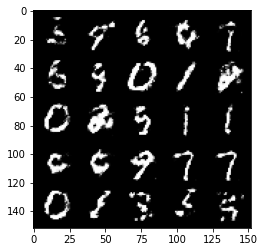

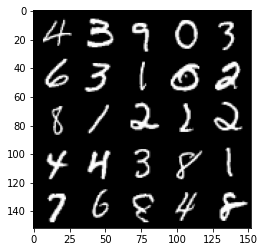

Step 91000: Generator loss: 0.9072229877710348, discriminator loss: 0.5955543988943098


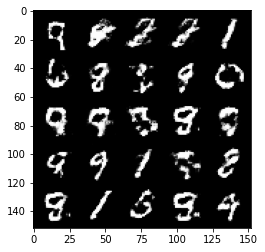

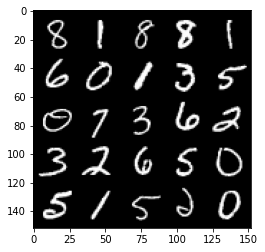

Step 91500: Generator loss: 0.8924947885274894, discriminator loss: 0.59658226799965


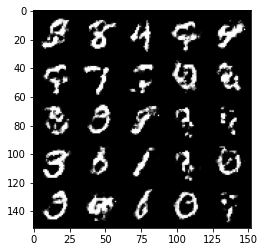

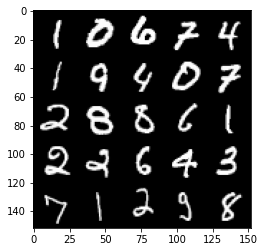

Step 92000: Generator loss: 0.8648422105312344, discriminator loss: 0.6181086058616635


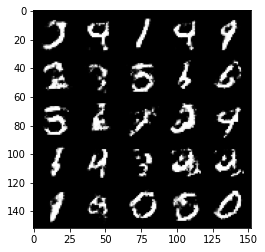

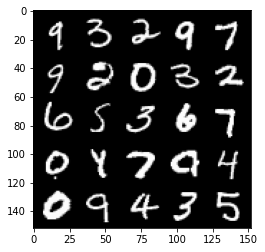

Step 92500: Generator loss: 0.9130639338493352, discriminator loss: 0.5952993572950366


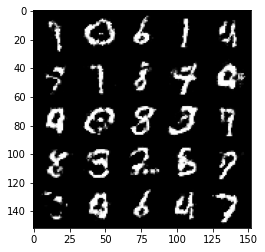

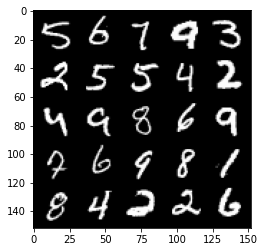

Step 93000: Generator loss: 0.9324504956007001, discriminator loss: 0.5869787840843207


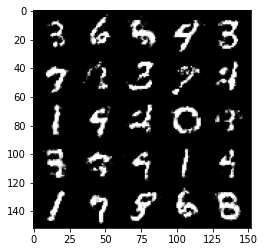

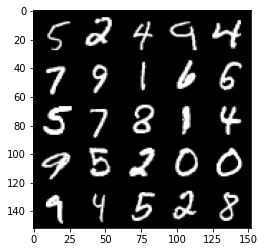

Step 93500: Generator loss: 0.9260217299461356, discriminator loss: 0.5904009991884234


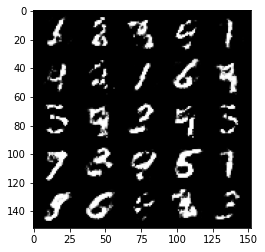

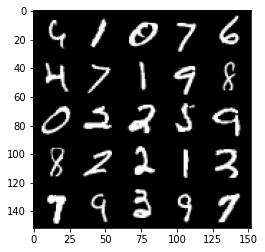

In [ ]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward()
        gen_opt.step()
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
